<center>
    <h1>CS 6476: Computer Vision, Fall 2020</h1>
    <h1>PS5 -- Extra Credit</h1>
    <h3>Instructor: Devi Parikh</h3>
    <h3>Due: Friday, November 20, 11:59 pm</h3>
</center>

## 1. Programing Problem [100 points]

### Introduction

For this problem, you will implement an action recognition method using Motion History Images. Given a video sequence, the goal is to predict which of a set of actions the subject is performing.

The basic idea is to use a sequence of depth images to segment out the foreground person. Then for each sequence, compute its motion history image (MHI). This MHI serves as a temporal template of the action performed, and can be further compressed into a set of 7 Hu moments. Once the Hu moments have been computed for all labelled training examples, we can categorize a novel test example by using nearest neighbour classification.

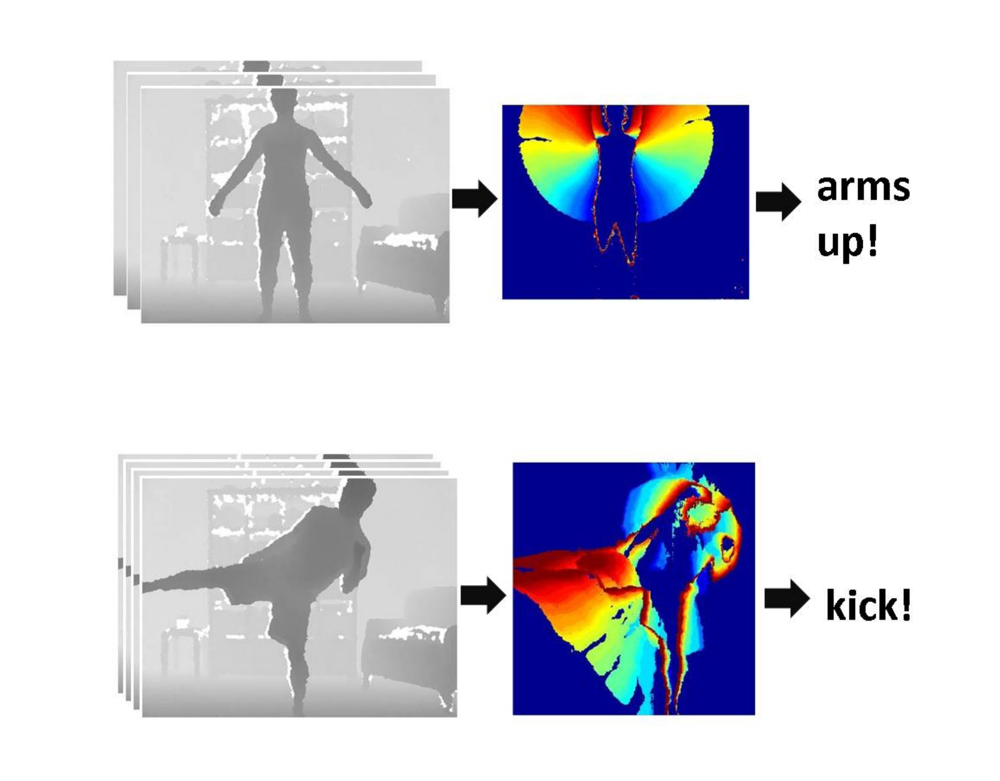

## Video Data

You can access the video data here (unzipped data occupies about 530MB of disk space):

https://gatech.box.com/shared/static/sw7dkza8drr2ouyko59haqyrczg3bbg0.zip

There are 5 directories within the zip file, each of which contains 4 sequences for one of the action categories.
The 5 action categories are: botharms, crouch, leftarmup, punch, righkick. Each directory under any one
of these 5 main directories contains the frames for a single sequence. For example, `punch/punch-p1-1/`
contains one sequence of frames for punch.

In [1]:
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt

from imageio import imread, imsave, mimsave
from IPython.display import Image

#############################################################################
# TODO: Add additional imports
#############################################################################

#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

## Part 0: Working with the data

The data are stored as ".pgm" images. Each PGM is a grayscale image, where the intensity is proportional
to depth in the scene. 

Note that the image frames are named sequentially, so that if you use `sorted(glob.glob())` the image list will be in the correct order.

See the cells below for an examples of how to loop over the videos and read in the files.

#### Select a random sequence

In [3]:
# setup
ROOT = "PS5_Data/"  # TODO: update `ROOT` to point to the "PS5_Data" folder
ACTIONS = ["botharms", "crouch", "leftarmup", "punch", "rightkick"]

# select a random sequence for a random action
action = random.choice(ACTIONS)
folders = glob.glob(os.path.join(ROOT, action, "*"))
folder = random.choice(folders)

# get the sorted image files
files = sorted(glob.glob(os.path.join(folder, "*.pgm")))

# get the images 
images = [np.array(imread(path)) for path in files]

print(f"Sequence: {folder}")
print(f"Sequence contains {len(files)} images")

Sequence: PS5_Data/leftarmup/leftarm-up-p2-2
Sequence contains 33 images


#### View all of the images in the squence

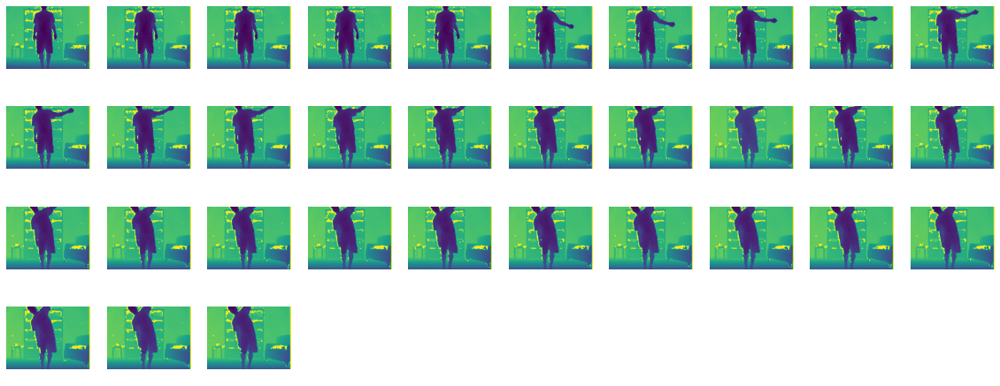

In [4]:
h = 10
w = len(images) // h + 1
fig, axs = plt.subplots(w, h, figsize=(2 * h, 2 * w))
for ax in axs.flat:
    ax.axis("off")
for img, ax in zip(images, axs.flat):
    ax.imshow(img)

#### View all of the images as a GIF

A better way to visualize this data is as a video or gif. You can see how to do this below.

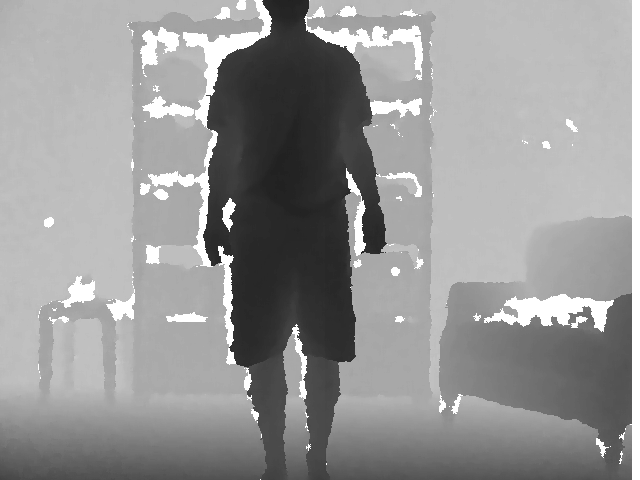

In [5]:
# convert images to "uint8"
converted_images = []
amin, amax = np.amin(images), np.amax(images)
for img in images:
    temp = (img.astype("float32") - amin) / (amax - amin)
    converted_images.append(np.uint8(255 * temp))

# save gif
mimsave("action.gif", converted_images)

# open gif in notebook
Image(open('action.gif','rb').read())

## Approach Overview

The main steps are as follows:


1. Load the depth map pgms in a given sequence, and perform background subtraction by using the depth data. (Choose reasonable threshold(s) on depth based on examining an example or two)

  Now, perform adjacent two-frame differencing to identify the pixels which have changed by a reasonable amount (above a threshold). Let's call these binary foreground difference images as $D(x, y, t)$.


2. Use all difference images in a $τ$ -frame sequence to compute its Motion History Image, $H_τ$ :

   $$
   H_τ(x, y, t) = \left\{
   \begin{array}{ll}
     τ & \text{if } D(x, y, t) = 1 \\
     max (0, Hτ (x, y, t − 1) − 1) & \text{otherwise} \\
   \end{array} 
   \right. \\
   $$
   
   where $t$ varies from $1$ to $τ$.


3. Normalize the Motion History Image (MHI) by the maximum value within it.


4. Use the MHI to compute a 7-dimensional vector containing the 7 Hu moments. This vector is the final representation for the entire video sequence, and describes the global shape of the temporal template in a translation- and rotation-invariant manner.


5. Having computed a descriptor vector for each video sequence, evaluate the nearest neighbour classification accuracy using *leave-one-out cross-validation*. That is, let every instance serve as a test case in turn, and classify it using the remaining instances.


6. For the nearest neighbour classifier, use the normalized Euclidean distance (i.e., where the distance per dimension is normalized according to the sample data’s variance).


7. Evaluate the results over all sequences based on the mean recognition rate per class and the confusion matrix.


See the paper *The Representation and Recognition of Action Using Temporal Templates by J. Davis and
A. Bobick* for more background on computing the MHI (available [here](https://gatech.box.com/s/j4tf5b2cwy630gdij7kwd82tz4yyeory)). For additional background on the
properties of Hu moments, see *Visual Pattern Recognition by Moment Invariants by M. K. Hu* (available
[here](https://gatech.box.com/s/5jva449d4hthiqyn55jh4vil1wfgudao)).

## Part 1. Motion History Image [30 points]

Complete the functions `background_subtraction`, `compute_two_frame_difference` and `compute_motion_history_image` as described below. Then, calculate Motion History Images (MHIs) for all of the action sequences in the dataset.

See the list of deliverables below.

In [6]:
def background_subtraction(image, threshold):
    """
    Returns an image with the background removed (zeroed out) wherever the pixel value
    is greater than the threshold. 

    Inputs:
    - image: HxW matrix - the image
    - threshold: integer - the background threshold
    
    Outputs:
    - foreground_image: the output image containing only the foreground pixels
    """
    foreground_image = image.copy()

    #############################################################################
    # TODO: Add your code here (note: this should only take a few line).        #
    #############################################################################
    for x in range(image.width):
        for y in range(image.height):
            if image.getpixel((x,y))> threshold:
                foreground_image.putpixel( (x,y), 0 )
                
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################

    return foreground_image

In [ ]:
def compute_two_frame_difference(image1, image2, threshold):
    """
    Returns a binary image that is `True` where the absolute difference between
    the two images is above a threshold.

    Inputs:
    - image1: HxW matrix - the first image
    - image2: HxW matrix - the second image
    - threshold: integer - the difference threshold
    
    Outputs:
    - diff: HxW matrix the output binary image
    """
    diff = np.zeros_like(image1, dtype="bool")

    #############################################################################
    # TODO: Add your code here (note: this should only take a few line).        #
    #############################################################################

    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################

    return diff

In [ ]:
def compute_motion_history_image(images, background_subtraction_threshold, difference_threshold):
    """ Returns a Motion History Image (MHI) for an action sequence.
    
    Steps:
    - Use your `background_subtraction` function to remove the background pixels.
    - Use your `compute_two_frame_difference` function to calculate $D(x,y,t)$
      for the image sequence.
    - Calculate the MHI using the equation in step 2 of the approach overview.
    - Remember to normalize the Motion History Image (step 3)
    
    Inputs:
    - images: List of HxW matrices - the image sequence
    - background_subtraction_threshold: integer - the threshold for background subtraction
    - difference_threshold: Integer - threshold for frame differencing
    
    Outputs:
    - MHI: HxW matrix - motion history image
    """
    assert len(images) > 0
    MHI = np.zeros_like(images[0])
    
    #############################################################################
    # TODO: Add your code here.                                                 #
    #############################################################################
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################

    return MHI

In [ ]:
#############################################################################
# TODO: Try different threshold values to get a reasonable looking MHI. You #
#       select a threshold so that only the foreground (person) contributes #
#       to the MHI (small noise in the background is okay). Then, see if    #
#       your threshold works well for other sequences by re-running the     #
#       random sequence selection code above.                               #
#############################################################################

MHI = compute_motion_history_image(images, background_subtraction_threshold=100000, 
                                   difference_threshold=0)

_, ax = plt.subplots()
ax.axis("off");
ax.imshow(MHI, cmap="jet");

#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

#### Generate MHIs for all of the image sequnces

Use your `compute_motion_history_image` function to compute the Motion History Images (MHIs) for all the data. Save the MHIs as a 480x640x20 numpy array named `all_MHIs.npy` and submit this file.

Display all 20 MHIs in a single figure with a 5x4 grid.

#### Deliverables:

- [ ] Manually add `background_subtraction`, `compute_two_frame_difference`, `compute_motion_history_image`, and the necessary imports to `ps5.py`.
- [ ] Submit `all_MHIs.npy` and `ps5.py` on Gradescope.
- [ ] Display the 5x4 grid of MHIs on your answer sheet.

In [ ]:
#############################################################################
# TODO: Compute MHI for all the sequences and save them in allMHIs.npy      #
#       Use `matplotlib.pyplot.subplots()` to display a 5x4 grid of all of  #
#       the MHI images.                                                     #
#############################################################################


#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

## Part 2. Hu Moments (15 pts) ###

Complete the function `compute_hu_moments` that takes a Motion History Image as input and returns a vector of length 7 containing the [Hu moments](https://gatech.box.com/s/tykh1w2svotcv1hniy8newzhcfq3z6co)
[(Normalized Variant)](https://en.wikipedia.org/wiki/Image_moment).

In [ ]:
#############################################################################
# Implement any additional helper functions (if needed) here.               #
#############################################################################


#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################


def compute_hu_moments(MHI):
    """
    Calculate the 7 Hu Moments of a Motion History Image

    Inputs:
    - MHI: HxW matrix - the Motion History Image

    Returns:
    - hm: A 1d array of length 7 containing the Hu Moments 
    """
    hm = np.zeros(7)
    #############################################################################
    # TODO: Compute Hu Moments for the given Motion History Image (H)           #  
    #############################################################################
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################
    
    return hm

Let's do a sanity check to test your Hu Moments implementation for any errors.

In [ ]:
input_image = np.array([[0.,1.,2.],[0.,1.,2.],[0.,1.,2.]])
expected_hu = np.array([ 8.00000000e+00,  1.60000000e+01,  4.44444444e-01,  4.44444444e-01,
  1.97530864e-01, -1.77777778e+00, -6.77927340e-32])
expected_hu_normalized = np.array([ 9.87654321e-02,  2.43865264e-03,  7.52670569e-06,  7.52670569e-06,
  5.66512986e-11, -3.71689170e-07, -1.86540852e-41])

def relative_error(expected, actual):
  return np.mean(np.abs((expected-actual)/np.maximum(expected,1.0)))

output = compute_hu_moments(input_image)
error = min(relative_error(expected_hu, output), relative_error(expected_hu_normalized, output))
print("Relative error: ",error)
if error < 1e-4:
  print("Sanity Check passed.")
else:
  print("Sanity Check failed.")
  print("Expected Output: \n", expected_hu, "\n or \n", expected_hu_normalized)
  print("Actual Output: ", output)

Please save and submit the Hu moments vectors of all the sequences in a file called `hu_vectors.npy`. This
file should contain a matrix of size 20x7.

#### Deliverables:

- [ ] Manually add `compute_hu_moments` and the necessary imports and helper functions to `ps5.py`.
- [ ] Submit `hu_vectors.npy` and `ps5.py` on Gradescope.

In [ ]:
#############################################################################
# TODO: Compute Hu Moments for all the MHIs from all_MHIs.npy               #
#       and save them in hu_vectors.npy                                     #
#############################################################################


#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

## Part 3. Predict Action (20 pts) ###

Complete the functions `normalized_euclidean_distance` and `predict_action` as described below.

In [ ]:
#############################################################################
# Implement any additional helper functions (if needed) here                #
#############################################################################

#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

def normalized_euclidean_distance(x, c, var):
    """
    Returns the Euclidean distance normalized with the variance of the data sample. 

    Inputs:
    - x: 7 dimensional vector containing the testMoment
    - c: A matrix of shape (N, 7) containing the trainMoments
    - var: 7 dimensional vector containing the variance of each Hu moment across the data sample.
    
    Outputs:
    - dists: A matrix of shape (N, 1) containing the normalized euclidean distance of 
      each trainMoment from the testMoment
    """
    N = c.shape[0]
    dists = np.zeros((N, 1), dtype="float64")
    #############################################################################
    # TODO: Add your code here                                                  #
    #############################################################################
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################
    return dists


def predict_action(testMoment, trainMoments, trainLabels):
    """
    Predict the action label for testMoment by using 
    nearest neighbour classification on trainMoments and trainLabels.

    Steps:
    - Calculate the variance of each of the 7 Hu Moments across the entire data sample (Train + Test data).
    - Use your `normalized_euclidean_distance` function to calculate the distance 
      between the testMoment from all the trainMoments.
    - Return the label of the training data point in trainMoments that is nearest to the testMoment.
    
    Note: This function can be used to perform leave-one-out cross validation.

    Inputs:
    - testMoment: 7 dimensional Hu moment decriptor representing the Test sequence
    - trainMoments: A matrix of shape (N, 7) containing Hu moment descriptors for N training instances
    - trainLabels: A vector of shape (N, 1) containing the action category labels for the N training instances 

    Returns:
    - predictedLabel: An integer from 0 to 4 denoting the predicted action label 
    """
    predictedLabel = 0
    #############################################################################
    # TODO: Using nearest neighbours predict the action label for testMoment   #  
    #############################################################################
    
    #############################################################################
    #                             END OF YOUR CODE                              #
    #############################################################################
    return predictedLabel



## Part 4. Show Nearest MHIs (20 pts)

Write a script below that displays the top K most similar Motion
History Images to an input test example, based on the normalized Euclidean distance between their
associated Hu moment descriptors. (Note that you display MHIs but still refer to distance in terms of
the videos’ Hu moment vectors.) 

Also, display the results for two selected test examples
(again, from different action categories), for K = 4.

#### Deliverables:

- [ ] Display 2 different test examples alongwith the top 4 most similar MHIs to each of them in your answer sheet.


In [ ]:
#############################################################################
# TODO: Compute the top K most similar MHIs for an input test example.      #
#       Display the results for 2 test examples from different action       #
#       categories and K = 4.                                               #
#############################################################################

#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

## Part 5. Classify All Actions (15 pts)

Use the nearest neighbour recognition function `predict_action` to perform *leave-one-out cross validation* for all the provided videos. 

Also, calculate the Overall recognition rate, Mean recognition rate per class and display a 5x5 confusion matrix.

#### Deliverables:

- [ ] Report the following in your answer sheet:
        1. Overall Recognition Rate
        2. Mean Recognition Rate Per Class
        3. Display a 5x5 Confusion matrix
        4. Discuss the performance and the most confused classes


In [ ]:
#############################################################################
# TODO: Perform leave-one-out cross validation on all the provided sequences.
#       Report the overall recognition rate, mean recognition rate per class
#       and display a 5x5 confusion matrix.
#############################################################################


#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################

## OPTIONAL: Extra credit (max 20 points) ##

Using ideas from any previous lectures, enhance the approach to try and improve the recognition
results. For example, you might incorporate a different classifier, distance function, or descriptor. You
might exploit the depth map for more than simply background subtraction, enhance the silhouette
computation,... 

#### Deliverables:

- [ ] Report the following in your answer sheet:
        1. How have you extended the method?
        2. What results did you get?
        3. How are they different from the results you got before? Why are they different?



In [ ]:
#############################################################################
# TODO: WRITE YOUR CODE HERE                                                #
#############################################################################

#############################################################################
#                             END OF YOUR CODE                              #
#############################################################################